In [1]:
pip install segypy

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install mayavi

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install obspy

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install pyvista

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install scienceplots

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install segpy

Note: you may need to restart the kernel to use updated packages.


In [7]:
import os
import numpy as np
import scienceplots
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

from pathlib import Path

In [8]:
# Setting some plotting options
plt.style.use(['science', 'grid', 'no-latex', 'bright'])

params = {'legend.fontsize': 'x-small',
          'figure.figsize': (4, 4),
          'figure.dpi':100,
          'axes.labelsize': 'x-small',
          'axes.titlesize': 'x-small',
          'xtick.labelsize': 'x-small',
          'ytick.labelsize': 'x-small',
          'font.family': 'DeJavu Serif',
          'font.serif': 'Times New Roman'}

pylab.rcParams.update(params)

In [9]:
from segpy.reader import create_reader


class SegyReader:
    def __init__(self, seismic_path: Path):
        self.path = seismic_path

    def __call__(self, filename):
        with open(self.path, 'rb') as file:
            segy_parser = create_reader(file)
            data = np.zeros(
                (segy_parser.num_inlines(), segy_parser.num_trace_samples(1),
                 segy_parser.num_xlines())
            )

            for inline, xline in segy_parser.inline_xline_numbers():
                trace_id = segy_parser.trace_index((inline, xline))
                inline_start = segy_parser.inline_numbers()[0]
                xline_start = segy_parser.xline_numbers()[0]
                data[inline - inline_start, :, xline - xline_start] = segy_parser.trace_samples(trace_id)
        
        # Normalizes seismic data
        self.data = (data - np.min(data)) / (np.max(data) - np.min(data))
        return self.data

CORES = os.cpu_count()
SEGY_PATH = Path("f3_dataset.sgy")

parser = SegyReader(SEGY_PATH)
seismic = parser(SEGY_PATH)

In [10]:
print(f"Seismic data of shape: {seismic.shape}")

Seismic data of shape: (651, 462, 951)


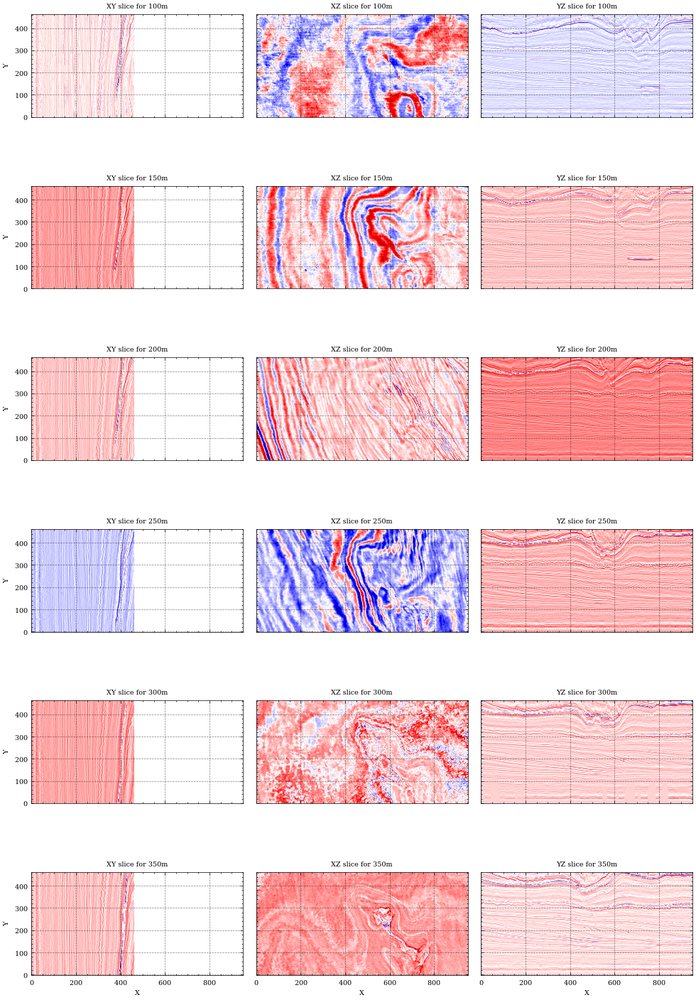

In [11]:
import matplotlib.pyplot as plt

# Set the observed inlines
obs_inlines = [100, 150, 200, 250, 300, 350]
mid_x = seismic.shape[0] // 2
mid_y = seismic.shape[1] // 2
mid_z = seismic.shape[2] // 2

fig, axes = plt.subplots(nrows=len(obs_inlines), ncols=3, figsize=(10, 15),
                         tight_layout=True, sharex=True, sharey=True)

for i in range(len(obs_inlines)):
    inline = obs_inlines[i]
    axes[i, 0].imshow(seismic[:, :, inline], cmap='seismic', origin='lower')
    axes[i, 1].imshow(seismic[:, inline, :], cmap='seismic', origin='lower')
    axes[i, 2].imshow(seismic[inline, :, :], cmap='seismic', origin='lower')

    # Set titles
    axes[i, 0].set_title(f"XY slice for {inline}m")
    axes[i, 1].set_title(f"XZ slice for {inline}m")
    axes[i, 2].set_title(f"YZ slice for {inline}m")

# Set common labels
for ax in axes[:, 0]:
    ax.set_ylabel('Y')

for ax in axes[-1, :]:
    ax.set_xlabel('X')

plt.show()

In [12]:
import pyvista as pv
import numpy as np

In [13]:
# Create a grid
grid = pv.StructuredGrid()

In [14]:
# Define the dimensions
dims = np.array(seismic.shape)
grid.dimensions = dims

In [15]:
# Define the grid points
x = np.arange(0, dims[0], 1)
y = np.arange(0, dims[1], 1)
z = np.arange(0, dims[2], 1)

In [16]:
# Create the mesh grid
# x, y, z = np.meshgrid(x, y, z, indexing='ij')
# grid.points = np.c_[x.ravel(order='F'), y.ravel(order='F'), z.ravel(order='F')]

In [17]:
# # 3D visualization using Pyvista
# grid = pv.StructuredGrid()

# # Define the dimensions and spacing
# dims = seismic.shape
# x = np.arange(0, dims[0])
# y = np.arange(0, dims[1])
# z = np.arange(0, dims[2])

# # Create the mesh grid
# x, y, z = np.meshgrid(x, y, z, indexing='ij')
# grid.points = np.c_[x.ravel(order='F'), y.ravel(order='F'), z.ravel(order='F')]
# grid.dimensions = dims

# # Add the seismic data as point data
# grid["values"] = seismic.flatten(order="F")

# # Create a plotter
# plotter = pv.Plotter()

# # Add volume rendering
# plotter.add_volume(grid, scalars="values", cmap="seismic", opacity="sigmoid", opacity_unit_distance=10)

# # Add slices
# plotter.add_mesh(grid.slice(normal="x", origin=(mid_x, 0, 0)), cmap="seismic")
# plotter.add_mesh(grid.slice(normal="y", origin=(0, mid_y, 0)), cmap="seismic")
# plotter.add_mesh(grid.slice(normal="z", origin=(0, 0, mid_z)), cmap="seismic")

# # Show the plot
# plotter.show()

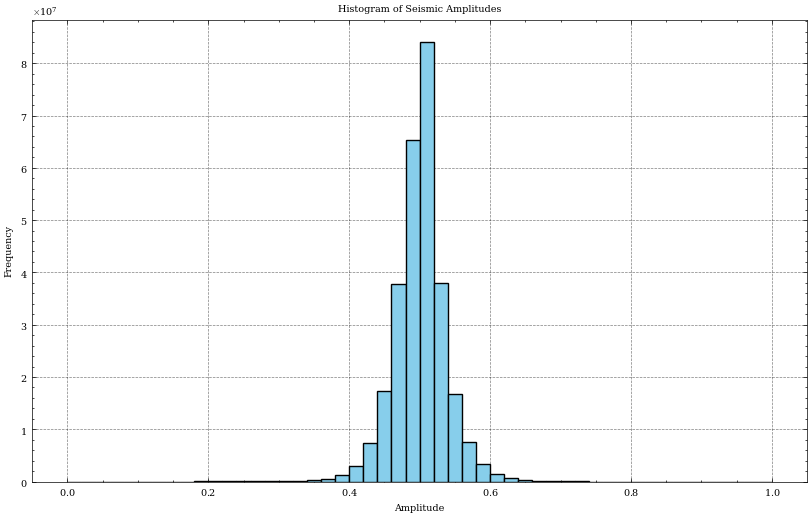

In [18]:
# Histogram of seismic amplitudes
plt.figure(figsize=(10, 6))
plt.hist(seismic.flatten(), bins=50, color='skyblue', edgecolor='black')
plt.title("Histogram of Seismic Amplitudes")
plt.xlabel("Amplitude")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

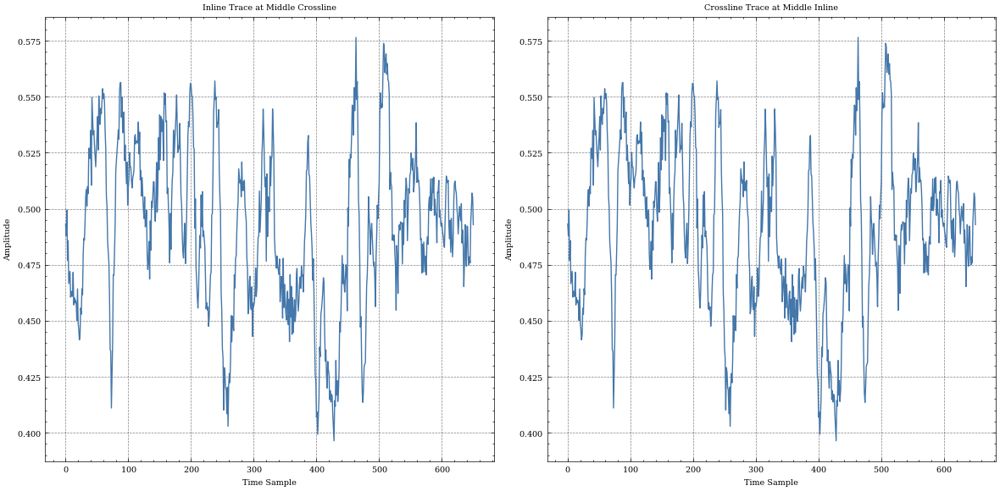

In [19]:
# Seismic Trace Plot
inline_trace = seismic[:, :, mid_z]
crossline_trace = seismic[:, mid_y, :]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(inline_trace[:, mid_y])
plt.title("Inline Trace at Middle Crossline")
plt.xlabel("Time Sample")
plt.ylabel("Amplitude")

plt.subplot(1, 2, 2)
plt.plot(crossline_trace[:, mid_z])
plt.title("Crossline Trace at Middle Inline")
plt.xlabel("Time Sample")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()

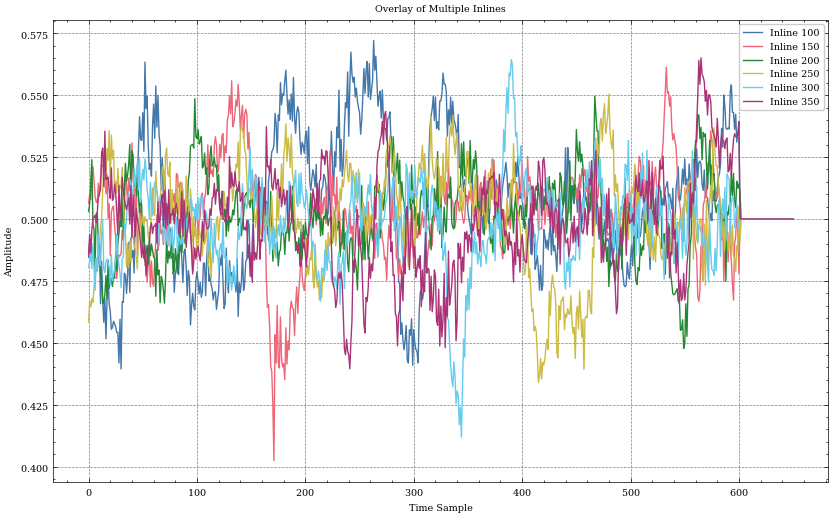

In [20]:
# Overlay of Multiple Inlines
plt.figure(figsize=(10, 6))
for inline in obs_inlines:
    plt.plot(seismic[:, :, inline][:, mid_y], label=f"Inline {inline}")
plt.title("Overlay of Multiple Inlines")
plt.xlabel("Time Sample")
plt.ylabel("Amplitude")
plt.legend()
plt.show()

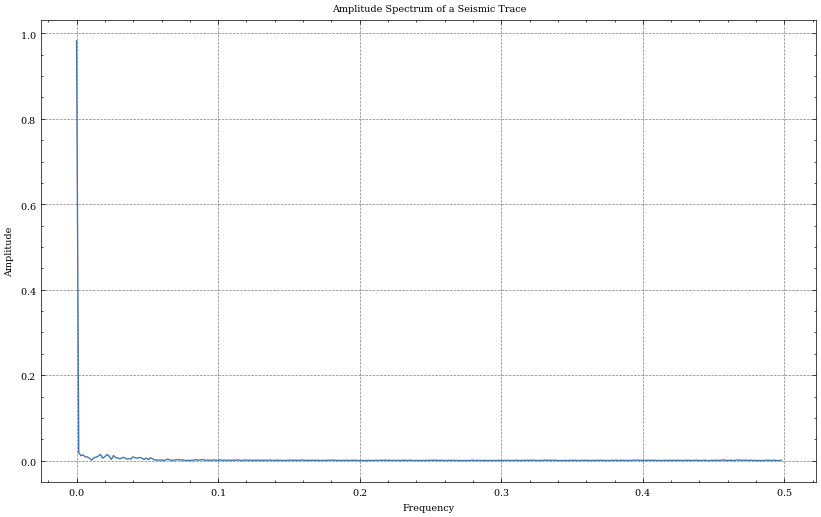

In [21]:
from scipy.fft import fft, fftfreq

# Compute the FFT of a trace
trace = seismic[:, mid_y, mid_z]
N = len(trace)
T = 1.0  # Assuming a sampling rate of 1 sample per unit time

# Compute FFT
yf = fft(trace)
xf = fftfreq(N, T)[:N//2]

plt.figure(figsize=(10, 6))
plt.plot(xf, 2.0/N * np.abs(yf[:N//2]))
plt.title("Amplitude Spectrum of a Seismic Trace")
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


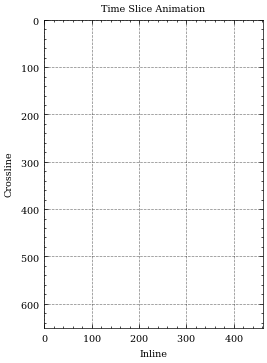

In [22]:
import matplotlib.animation as animation

fig, ax = plt.subplots()
ims = []

for i in range(seismic.shape[2]):
    im = ax.imshow(seismic[:, :, i], cmap='seismic', animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat_delay=1000)
plt.title("Time Slice Animation")
plt.xlabel("Inline")
plt.ylabel("Crossline")
plt.show()

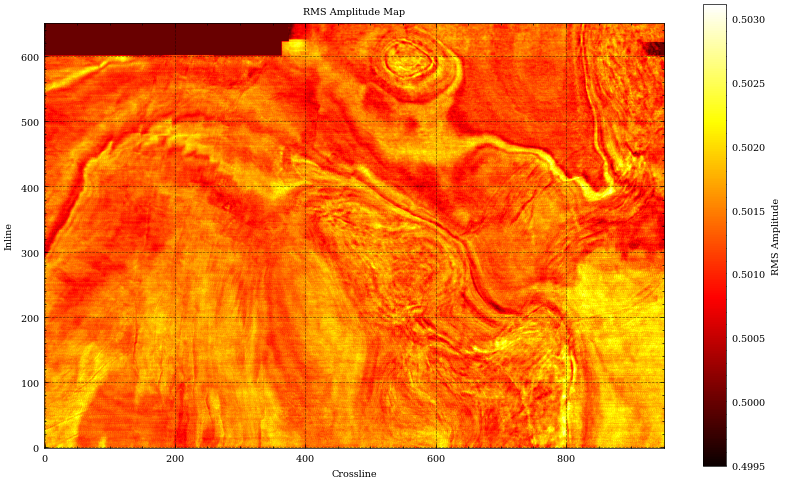

In [23]:
# RMS Amplitude for inline and crossline
rms_amplitude = np.sqrt(np.mean(seismic**2, axis=1))

plt.figure(figsize=(10, 6))
plt.imshow(rms_amplitude, cmap='hot', origin='lower')
plt.title("RMS Amplitude Map")
plt.xlabel("Crossline")
plt.ylabel("Inline")
plt.colorbar(label='RMS Amplitude')
plt.show()

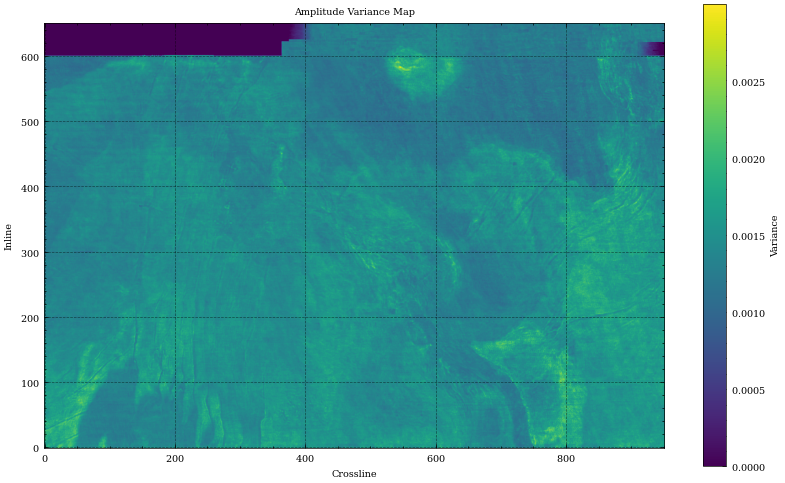

In [24]:
# Amplitude Variance Map
amplitude_variance = np.var(seismic, axis=1)

plt.figure(figsize=(10, 6))
plt.imshow(amplitude_variance, cmap='viridis', origin='lower')
plt.title("Amplitude Variance Map")
plt.xlabel("Crossline")
plt.ylabel("Inline")
plt.colorbar(label='Variance')
plt.show()

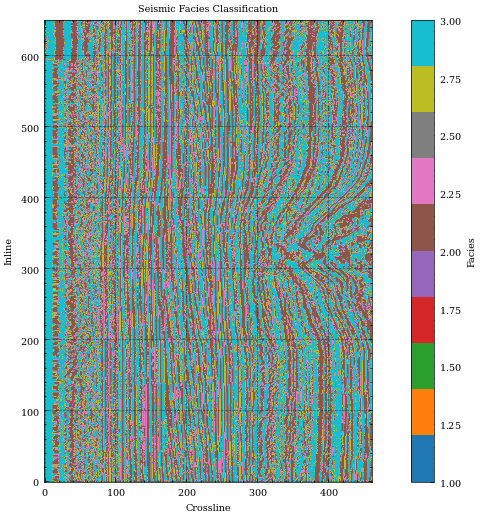

In [25]:
# Seismic Facies Classification

# Define facies based on amplitude ranges
facies = np.digitize(seismic, bins=[-0.2, 0.2, 0.5])

plt.figure(figsize=(10, 6))
plt.imshow(facies[:, :, mid_z], cmap='tab10', origin='lower')
plt.title("Seismic Facies Classification")
plt.xlabel("Crossline")
plt.ylabel("Inline")
plt.colorbar(label='Facies')
plt.show()


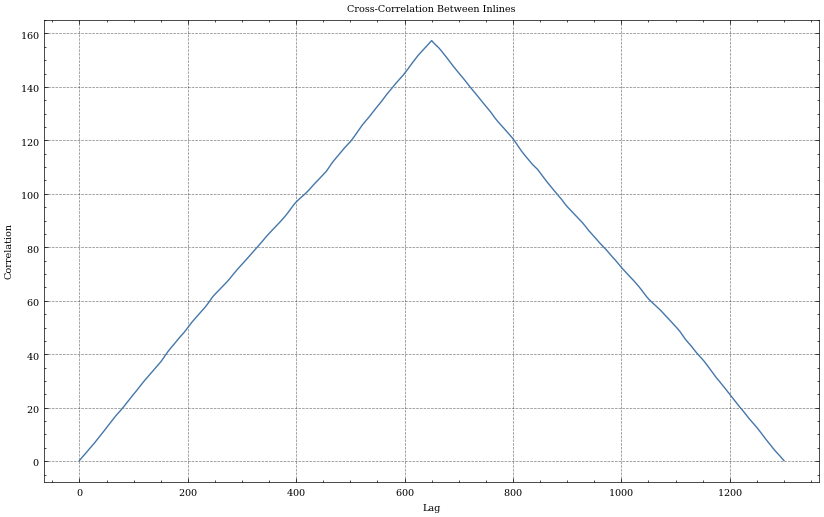

In [26]:
# Correlation Plot

from scipy.signal import correlate

inline_corr = correlate(seismic[:, mid_y, mid_z], seismic[:, mid_y, mid_z + 10], mode='full')

plt.figure(figsize=(10, 6))
plt.plot(inline_corr)
plt.title("Cross-Correlation Between Inlines")
plt.xlabel("Lag")
plt.ylabel("Correlation")
plt.grid(True)
plt.show()


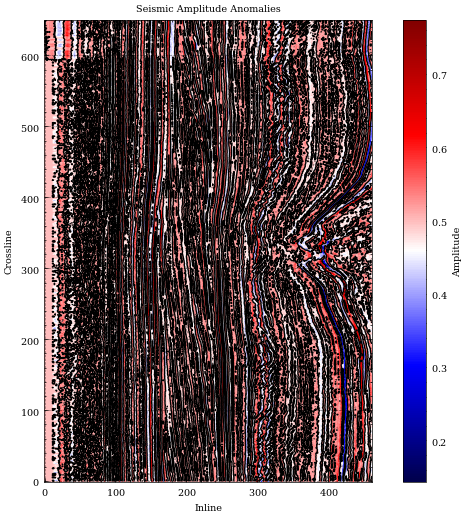

In [27]:
#Amplitude Anomalies

# Example: Plotting amplitude anomalies (hypothetical)
plt.figure(figsize=(8, 6))
plt.imshow(seismic[:, :, mid_z], cmap='seismic', origin='lower')
plt.title("Seismic Amplitude Anomalies")
plt.colorbar(label='Amplitude')
plt.xlabel("Inline")
plt.ylabel("Crossline")
plt.contour(seismic[:, :, mid_z], levels=[0.5, 0.7], colors='black', linewidths=1)
plt.show()


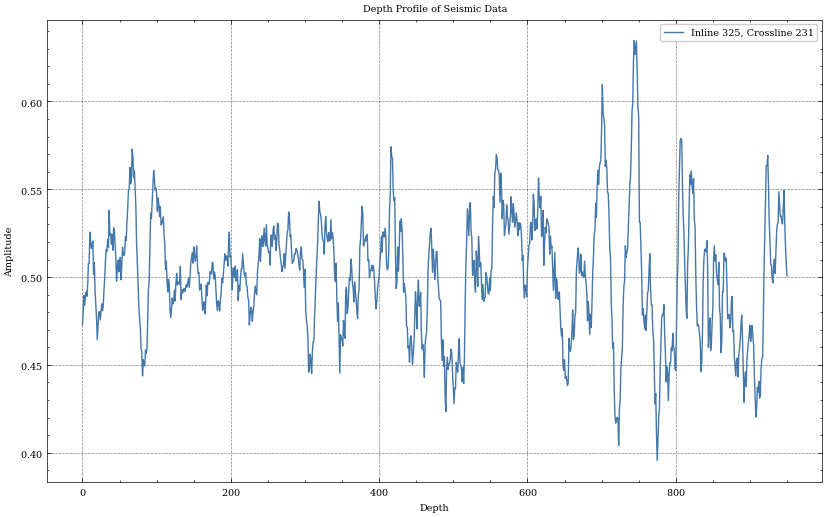

In [28]:
# Depth profile plot
depth_profile = seismic[mid_x, mid_y, :]

plt.figure(figsize=(10, 6))
plt.plot(depth_profile, label=f"Inline {mid_x}, Crossline {mid_y}")
plt.title("Depth Profile of Seismic Data")
plt.xlabel("Depth")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.show()


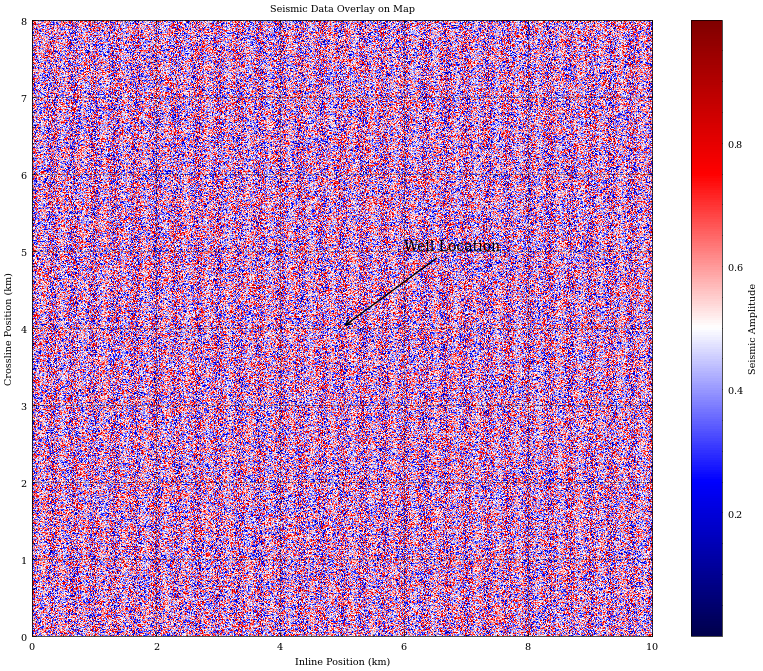

In [29]:
# Overlaying Seismic Data on a Map

import matplotlib.pyplot as plt
import numpy as np

# Example seismic data dimensions (replace with actual dimensions if available)
num_inlines, num_crosslines = seismic.shape[0], seismic.shape[2]

# Example map dimensions
map_width = 10  # Replace with actual map width in km
map_height = 8  # Replace with actual map height in km

# Create synthetic inline and crossline positions
inlines = np.linspace(0, map_width, num_inlines)
crosslines = np.linspace(0, map_height, num_crosslines)

# Create a meshgrid for the map
inline_grid, crossline_grid = np.meshgrid(inlines, crosslines)

# Example seismic data (replace with actual data)
seismic_data = np.random.rand(num_inlines, num_crosslines)  # Replace with actual seismic data

# Plotting seismic data overlay on map
plt.figure(figsize=(10, 8))
plt.imshow(seismic_data.T, extent=[0, map_width, 0, map_height], cmap='seismic', origin='lower', aspect='auto')
plt.colorbar(label='Seismic Amplitude')
plt.title('Seismic Data Overlay on Map')
plt.xlabel('Inline Position (km)')
plt.ylabel('Crossline Position (km)')

# Add annotations or features if available
plt.annotate('Well Location', xy=(5, 4), xytext=(6, 5),
             arrowprops=dict(facecolor='black', arrowstyle='->'),
             )

plt.grid(True)
plt.show()

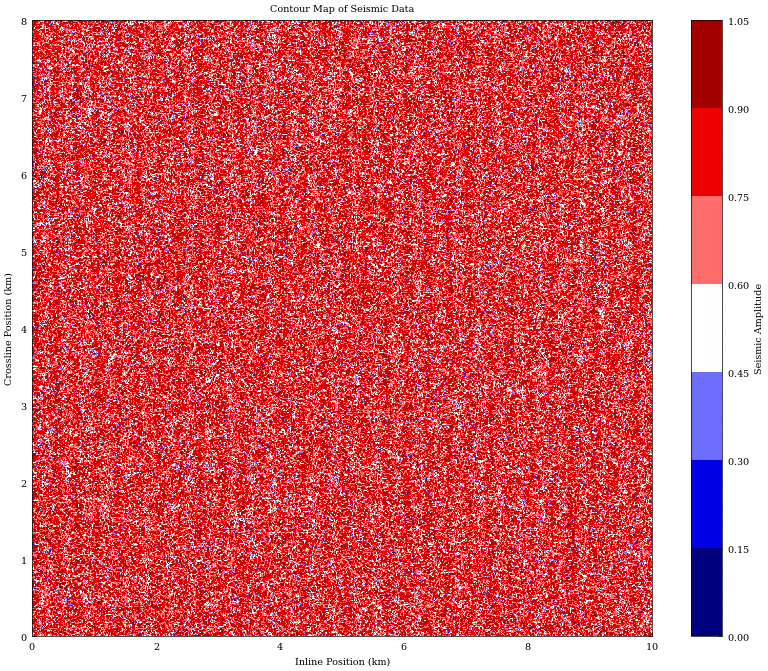

In [30]:
# Contour plot of seismic amplitude
plt.figure(figsize=(10, 8))
contours = plt.contourf(inline_grid, crossline_grid, seismic_data.T, cmap='seismic')
plt.colorbar(contours, label='Seismic Amplitude')
plt.title('Contour Map of Seismic Data')
plt.xlabel('Inline Position (km)')
plt.ylabel('Crossline Position (km)')
plt.grid(True)
plt.show()


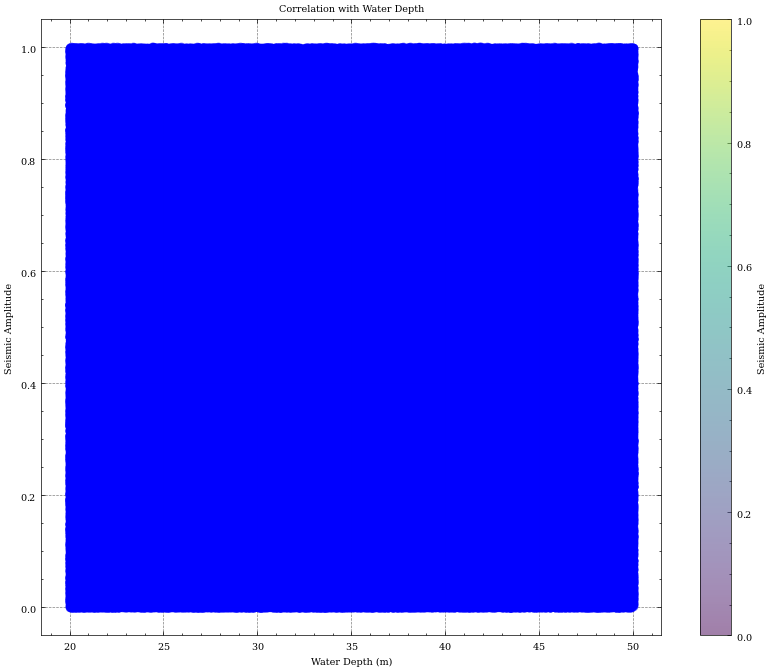

In [31]:
# Correlation plot with water depth (hypothetical example as a use case)
water_depth = np.random.uniform(low=20, high=50, size=(num_inlines, num_crosslines))

plt.figure(figsize=(10, 8))
plt.scatter(water_depth.flatten(), seismic_data.flatten(), c='blue', alpha=0.5)
plt.colorbar(label='Seismic Amplitude')
plt.title('Correlation with Water Depth')
plt.xlabel('Water Depth (m)')
plt.ylabel('Seismic Amplitude')
plt.grid(True)
plt.show()


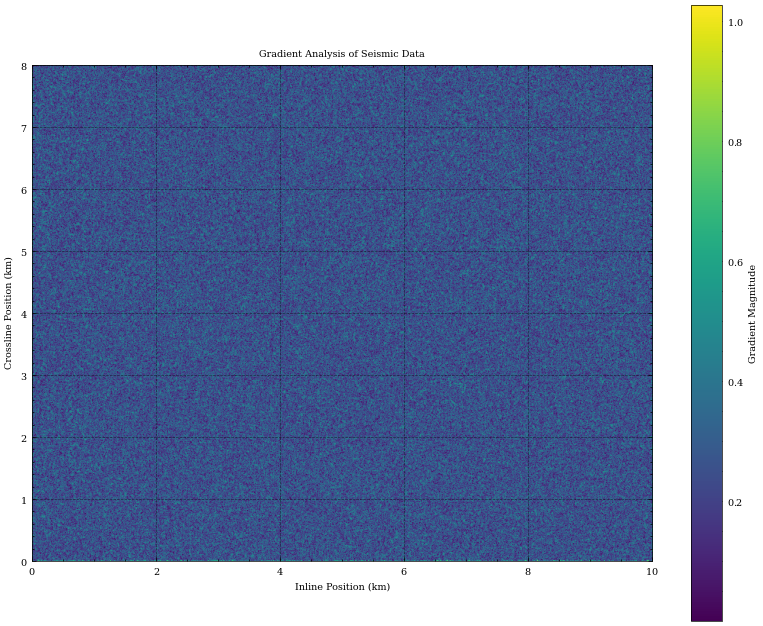

In [32]:
# Gradient analysis
gradient_x, gradient_y = np.gradient(seismic_data)

plt.figure(figsize=(10, 8))
plt.imshow(np.sqrt(gradient_x**2 + gradient_y**2), extent=[0, map_width, 0, map_height], cmap='viridis', origin='lower')
plt.colorbar(label='Gradient Magnitude')
plt.title('Gradient Analysis of Seismic Data')
plt.xlabel('Inline Position (km)')
plt.ylabel('Crossline Position (km)')
plt.grid(True)
plt.show()


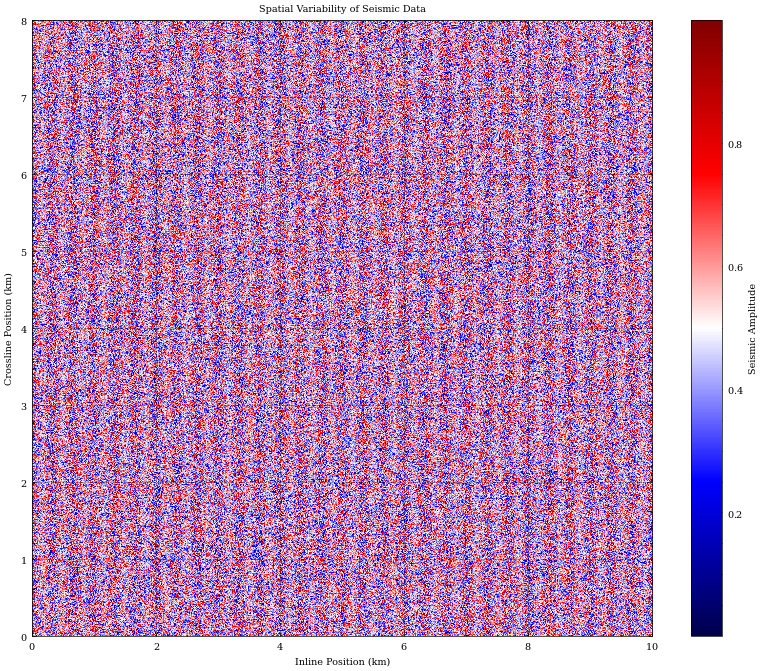

In [33]:
# Spatial variability plot (hypothetical)
plt.figure(figsize=(10, 8))
plt.imshow(seismic_data.T, extent=[0, map_width, 0, map_height], cmap='seismic', origin='lower', aspect='auto')
plt.colorbar(label='Seismic Amplitude')
plt.title('Spatial Variability of Seismic Data')
plt.xlabel('Inline Position (km)')
plt.ylabel('Crossline Position (km)')
plt.grid(True)
plt.show()


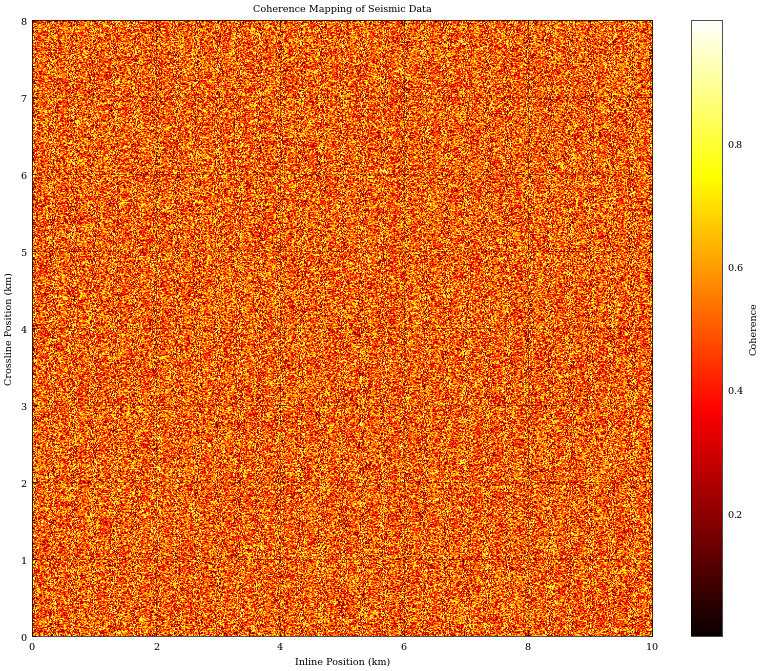

In [34]:
# Coherence mapping (hypothetical)
coherence_data = np.random.rand(num_inlines, num_crosslines)  # Replace with actual coherence data if available

plt.figure(figsize=(10, 8))
plt.imshow(coherence_data.T, extent=[0, map_width, 0, map_height], cmap='hot', origin='lower', aspect='auto')
plt.colorbar(label='Coherence')
plt.title('Coherence Mapping of Seismic Data')
plt.xlabel('Inline Position (km)')
plt.ylabel('Crossline Position (km)')
plt.grid(True)
plt.show()

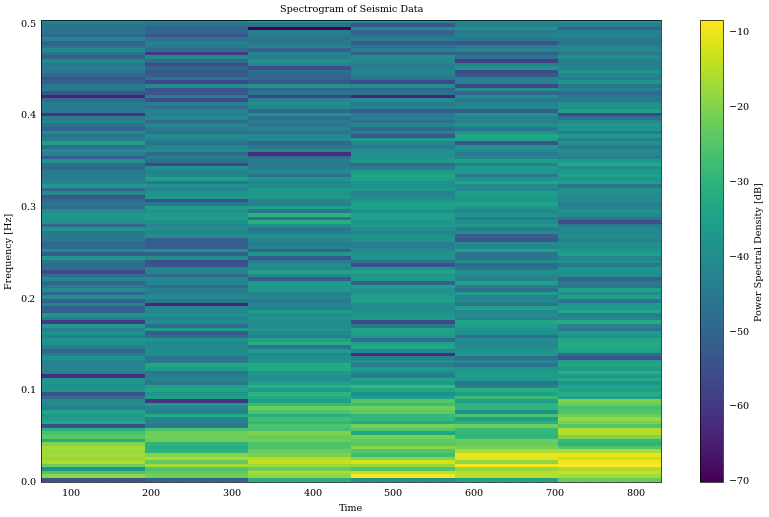

In [35]:
from scipy import signal

# Example spectrogram of seismic data at a specific point
inline_point = mid_x
crossline_point = mid_y

plt.figure(figsize=(10, 6))
frequencies, times, Sxx = signal.spectrogram(seismic[inline_point, crossline_point, :], fs=1.0, nperseg=256, noverlap=128)
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), cmap='viridis')
plt.title('Spectrogram of Seismic Data')
plt.xlabel('Time')
plt.ylabel('Frequency [Hz]')
plt.colorbar(label='Power Spectral Density [dB]')
plt.grid(True)
plt.show()


In [36]:
pip install configobj

Note: you may need to restart the kernel to use updated packages.


In [37]:
# # Example using Mayavi for interactive 3D visualization
# from mayavi import mlab

# # Assuming 'seismic' is your 3D seismic data array

# # Plotting the seismic volume
# mlab.figure(bgcolor=(1, 1, 1))
# vol = mlab.pipeline.volume(mlab.pipeline.scalar_field(seismic), vmin=0, vmax=1)
# mlab.colorbar(title='Amplitude')
# mlab.outline()
# mlab.show()


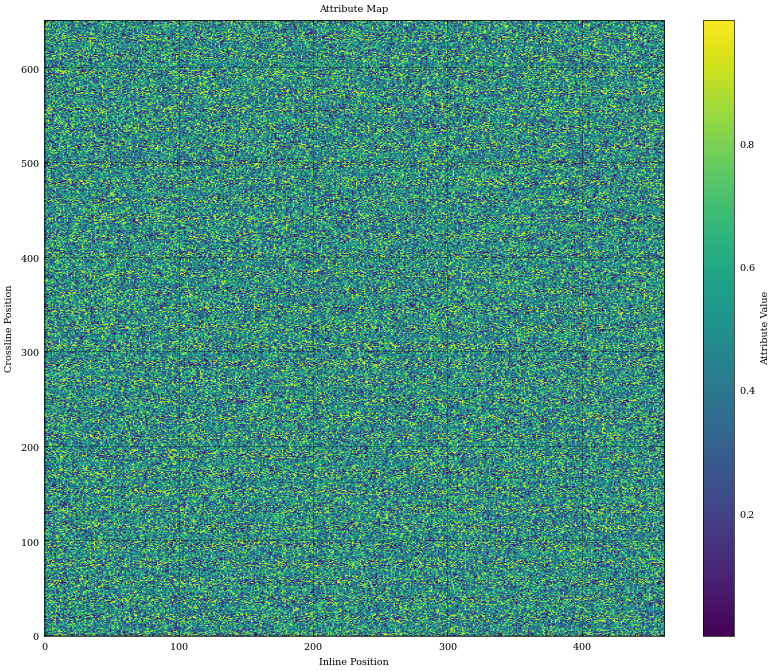

In [38]:
# Attribute map
attribute_map = np.random.rand(seismic.shape[0], seismic.shape[1])  # Replace with actual attribute calculation

plt.figure(figsize=(10, 8))
plt.imshow(attribute_map, cmap='viridis', origin='lower', aspect='auto')
plt.colorbar(label='Attribute Value')
plt.title('Attribute Map')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()

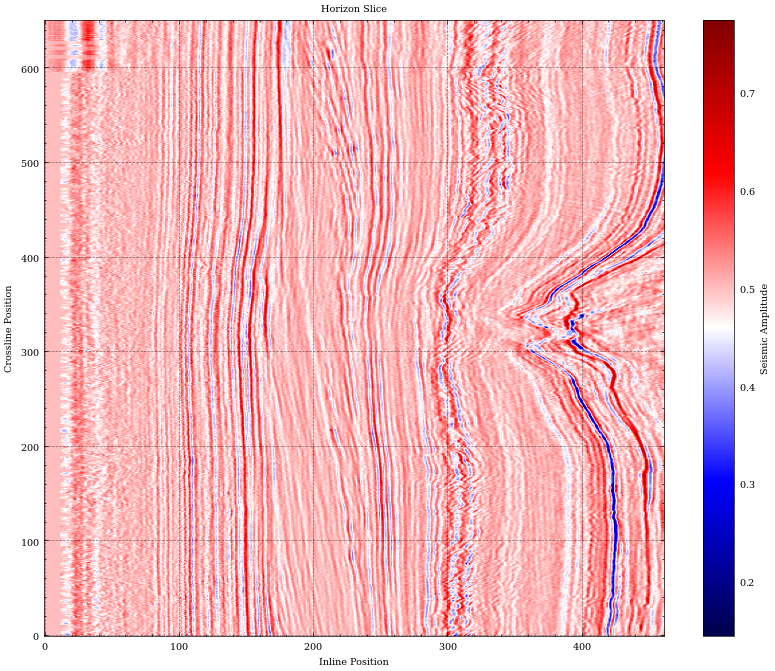

In [39]:
# Example horizon slice (hypothetical)
horizon_slice = seismic[:, :, mid_z]  # Assuming mid_z is the depth slice of interest

plt.figure(figsize=(10, 8))
plt.imshow(horizon_slice, cmap='seismic', origin='lower', aspect='auto')
plt.colorbar(label='Seismic Amplitude')
plt.title('Horizon Slice')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()

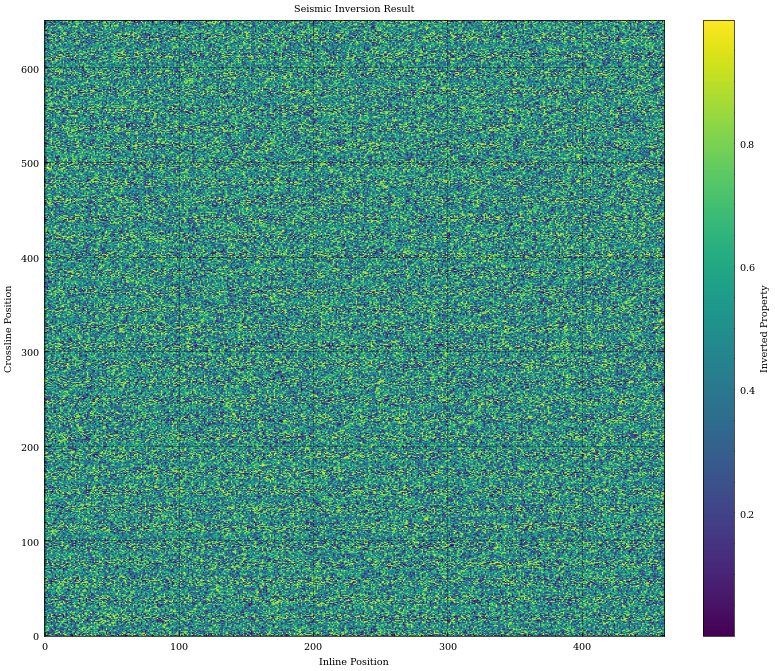

In [40]:
# Example seismic inversion (hypothetical)
inverted_seismic = np.random.rand(seismic.shape[0], seismic.shape[1], seismic.shape[2])  # Replace with actual inversion result

# Visualizing inverted volume
plt.figure(figsize=(10, 8))
plt.imshow(inverted_seismic[:, :, mid_z], cmap='viridis', origin='lower', aspect='auto')
plt.colorbar(label='Inverted Property')
plt.title('Seismic Inversion Result')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()


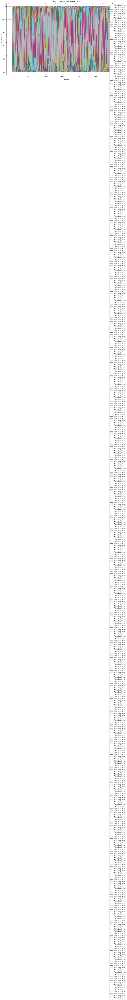

In [41]:
# Example well correlation (hypothetical)
well_data = np.random.rand(seismic.shape[0], seismic.shape[1])  # Replace with actual well log data

plt.figure(figsize=(10, 6))
plt.plot(well_data, label='Well Log Data')
plt.title('Well Correlation with Seismic Data')
plt.xlabel('Depth')
plt.ylabel('Property Value')
plt.legend()
plt.grid(True)
plt.show()


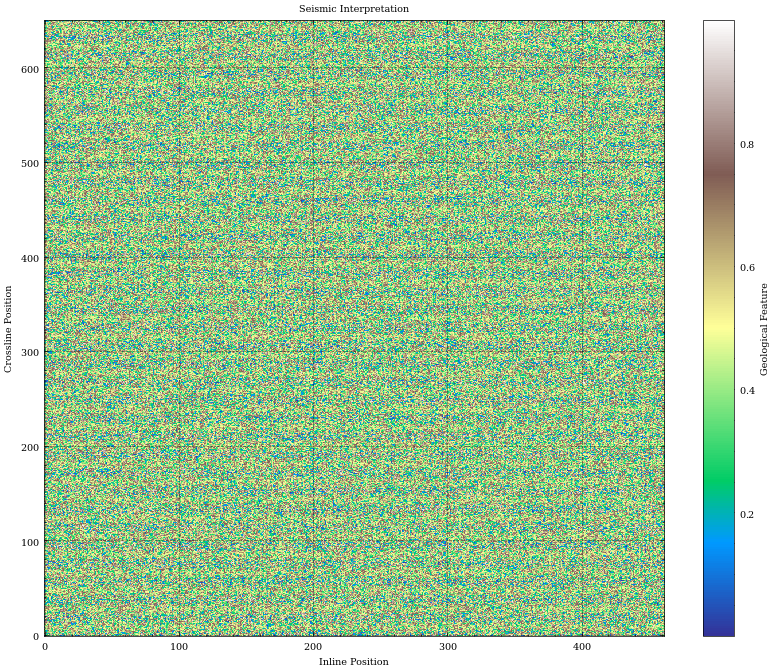

In [42]:
# Example seismic interpretation (hypothetical)
interpreted_map = np.random.rand(seismic.shape[0], seismic.shape[1])  # Replace with actual interpretation result

# Visualizing interpreted map
plt.figure(figsize=(10, 8))
plt.imshow(interpreted_map, cmap='terrain', origin='lower', aspect='auto')
plt.colorbar(label='Geological Feature')
plt.title('Seismic Interpretation')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()


In [43]:
# Volume Rendering

import numpy as np
from mayavi import mlab

# Generate random 3D seismic data (replace with actual data)
seismic = np.random.rand(100, 100, 100)

# Plotting the seismic volume
mlab.figure(bgcolor=(1, 1, 1))
vol = mlab.pipeline.volume(mlab.pipeline.scalar_field(seismic), vmin=0, vmax=1)
mlab.colorbar(title='Amplitude')
mlab.outline()
mlab.show()

qt.qpa.window: <QNSWindow: 0x7fa5b6e50940; contentView=<QNSView: 0x7fa5b6e50540; QCocoaWindow(0x600001f1ad60, window=QWidgetWindow(0x600000c96220, name="QMainWindowClassWindow"))>> has active key-value observers (KVO)! These will stop working now that the window is recreated, and will result in exceptions when the observers are removed. Break in QCocoaWindow::recreateWindowIfNeeded to debug.


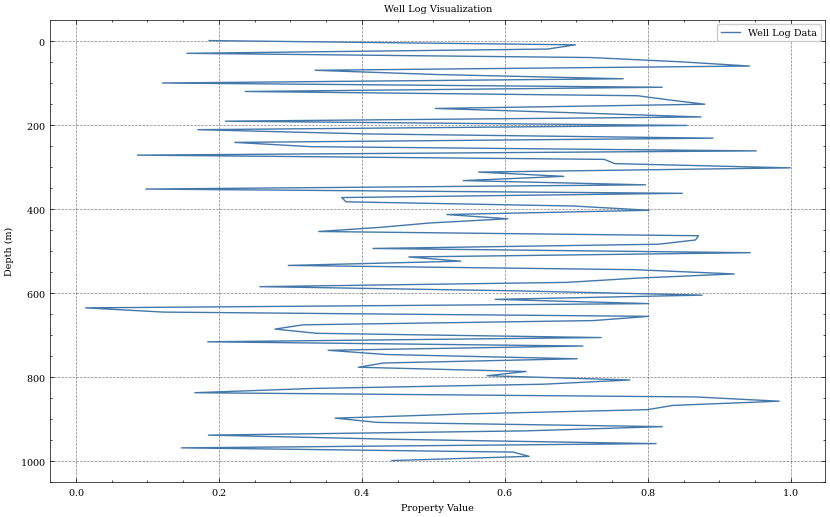

In [44]:
# Example well log data visualization (hypothetical data)
depth = np.linspace(0, 1000, 100)
well_log = np.random.rand(100)

plt.figure(figsize=(10, 6))
plt.plot(well_log, depth, label='Well Log Data')
plt.title('Well Log Visualization')
plt.xlabel('Property Value')
plt.ylabel('Depth (m)')
plt.legend()
plt.grid(True)
plt.gca().invert_yaxis()
plt.show()


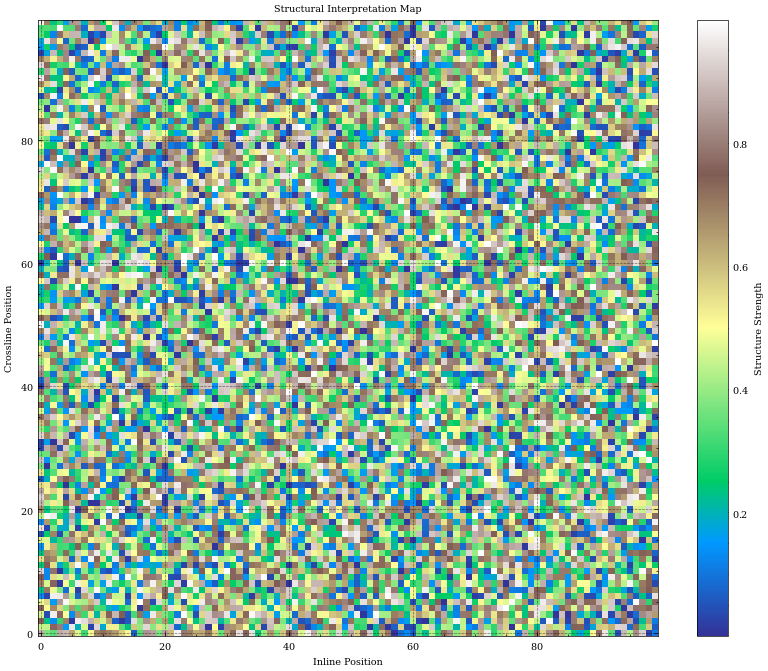

In [45]:
# Example structural interpretation map (hypothetical data)
structure_map = np.random.rand(100, 100)

plt.figure(figsize=(10, 8))
plt.imshow(structure_map, cmap='terrain', origin='lower', aspect='auto')
plt.colorbar(label='Structure Strength')
plt.title('Structural Interpretation Map')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()


In [46]:
# Example geobody modeling (hypothetical data)
geobody_model = np.random.rand(100, 100, 100)

mlab.figure(bgcolor=(1, 1, 1))
mlab.contour3d(geobody_model, contours=10, opacity=0.5, colormap='viridis')
mlab.colorbar(title='Geobody Strength')
mlab.outline()
mlab.show()


qt.qpa.window: <QNSWindow: 0x7fa7def43ce0; contentView=<QNSView: 0x7fa7be86c190; QCocoaWindow(0x600001f9a100, window=QWidgetWindow(0x600000ceed00, name="QMainWindowClassWindow"))>> has active key-value observers (KVO)! These will stop working now that the window is recreated, and will result in exceptions when the observers are removed. Break in QCocoaWindow::recreateWindowIfNeeded to debug.


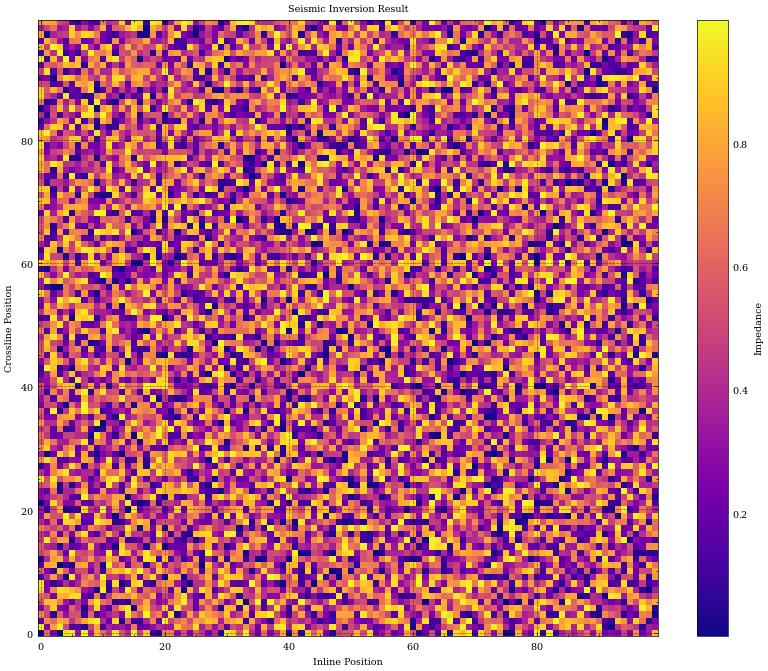

In [47]:
# Example seismic inversion result visualization (hypothetical data)
inversion_result = np.random.rand(100, 100)

plt.figure(figsize=(10, 8))
plt.imshow(inversion_result, cmap='plasma', origin='lower', aspect='auto')
plt.colorbar(label='Impedance')
plt.title('Seismic Inversion Result')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()


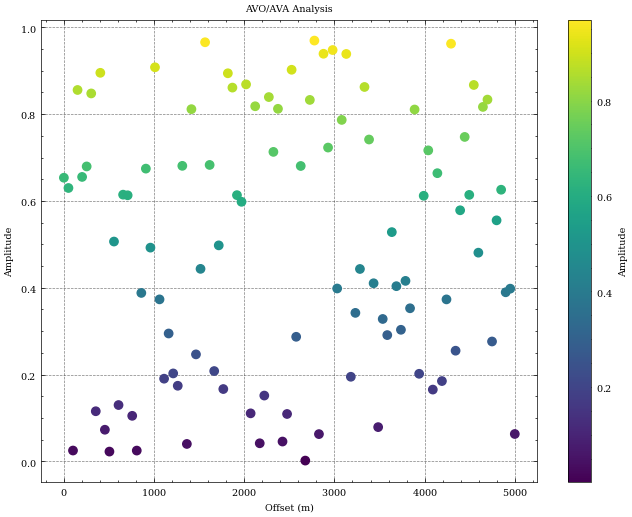

In [48]:
# Example AVO/AVA cross-plot (hypothetical data)
offset = np.linspace(0, 5000, 100)
amplitude = np.random.rand(100)

plt.figure(figsize=(8, 6))
plt.scatter(offset, amplitude, c=amplitude, cmap='viridis')
plt.colorbar(label='Amplitude')
plt.title('AVO/AVA Analysis')
plt.xlabel('Offset (m)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()


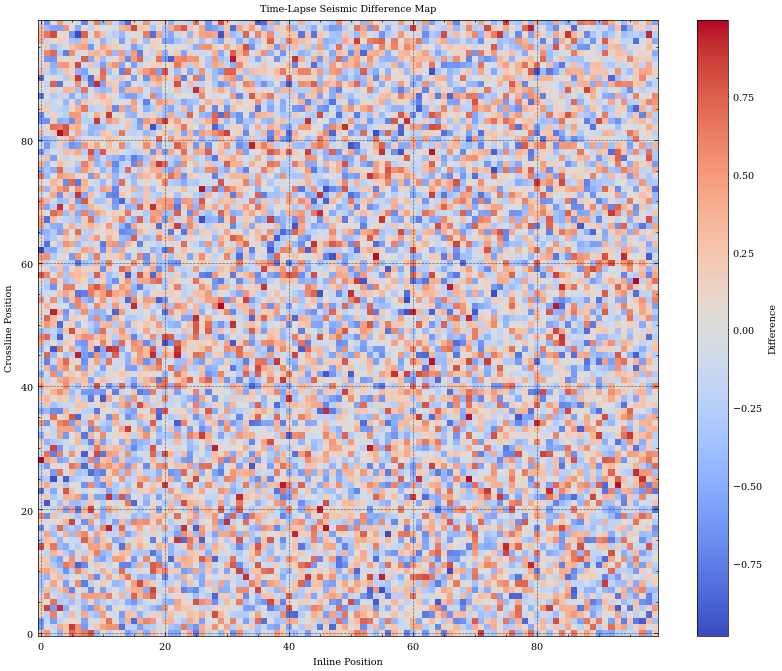

In [49]:
# Example time-lapse seismic difference map (hypothetical data)
time1_data = np.random.rand(100, 100)
time2_data = np.random.rand(100, 100)
difference_map = time2_data - time1_data

plt.figure(figsize=(10, 8))
plt.imshow(difference_map, cmap='coolwarm', origin='lower', aspect='auto')
plt.colorbar(label='Difference')
plt.title('Time-Lapse Seismic Difference Map')
plt.xlabel('Inline Position')
plt.ylabel('Crossline Position')
plt.grid(True)
plt.show()


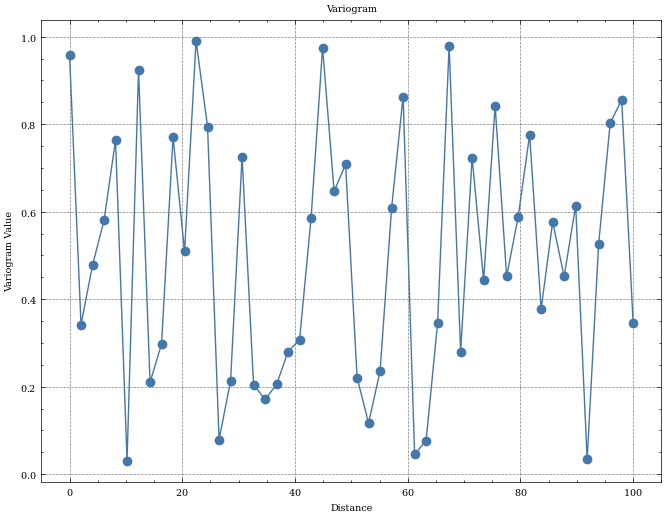

In [50]:
# Example variogram (hypothetical data)
distance = np.linspace(0, 100, 50)
variogram = np.random.rand(50)

plt.figure(figsize=(8, 6))
plt.plot(distance, variogram, marker='o')
plt.title('Variogram')
plt.xlabel('Distance')
plt.ylabel('Variogram Value')
plt.grid(True)
plt.show()


In [55]:

# Generate random 3D seismic data (replace with actual data)
seismic = np.random.rand(100, 100, 100)

# Create a Mayavi figure
fig = mlab.figure(bgcolor=(1, 1, 1))

# Contouring and surface rendering
mlab.contour3d(seismic, contours=10, opacity=0.5, colormap='viridis')

mlab.colorbar(title='Amplitude')
mlab.outline()
mlab.show()

qt.qpa.window: <QNSWindow: 0x7fa44d7cf2b0; contentView=<QNSView: 0x7fa44d7ceeb0; QCocoaWindow(0x600001fce310, window=QWidgetWindow(0x600010ddd620, name="QMainWindowClassWindow"))>> has active key-value observers (KVO)! These will stop working now that the window is recreated, and will result in exceptions when the observers are removed. Break in QCocoaWindow::recreateWindowIfNeeded to debug.
